In [ ]:
# Install required libraries
!pip install tensorflow opencv-python matplotlib numpy scikit-learn rasterio gdal elevation earthpy landsatxplore sentinelsat

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.1/43.1 kB 1.4 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of geopandas to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 1.6 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of fiona to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.4/56.4 kB 681.7 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.7/49.7 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.2/48.2 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.6/47.6 kB 2.5 MB/s eta

In [ ]:
!pip install gdal

In [ ]:
# Import necessary libraries
import tensorflow as tf
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import rasterio
from rasterio.transform import from_origin
#import gdal
import shutil
from google.colab import drive
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep
import datetime
import seaborn as sns
import pandas as pd
from landsatxplore.api import API
from landsatxplore.earthexplorer import EarthExplorer

# Mount Google Drive to access data
drive.mount('/content/drive')

# Define paths
BASE_PATH = "/content/drive/MyDrive/HKP/data"
WWTP_PATH = os.path.join(BASE_PATH, "WWTP")
NON_WWTP_PATH = os.path.join(BASE_PATH, "NONWWTP")
OUTPUT_PATH = os.path.join(BASE_PATH, "output")
DTM_OUTPUT_PATH = os.path.join(OUTPUT_PATH, "dtm_output_images")
DEM_OUTPUT_PATH = os.path.join(OUTPUT_PATH, "dem_output_images")
LANDSAT_OUTPUT_PATH = os.path.join(OUTPUT_PATH, "landsat_output_images")
MODEL_PATH = os.path.join(OUTPUT_PATH, "models")

# Create output directories if they don't exist
for path in [OUTPUT_PATH, DTM_OUTPUT_PATH, DEM_OUTPUT_PATH, LANDSAT_OUTPUT_PATH, MODEL_PATH]:
    if not os.path.exists(path):
        os.makedirs(path)

# Parameters
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 25
NUM_CLASSES = 2
LEARNING_RATE = 0.001

# Define categories and labels
CATEGORIES = {
    "NONWWTP": 0,
    "WWTP": 1
}

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#################
# Data Utilities #
#################

def normalize_image(image_path, output_path):
    """
    Normalize an image and save to output path
    """
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)
    if img is None:
        print(f"Error loading image: {image_path}")
        return False

    normalized_img = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX)
    return cv2.imwrite(output_path, normalized_img)

def detect_edges(image_path, output_path=None):
    """
    Detect edges in an image using Canny edge detection
    """
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Error loading image: {image_path}")
        return None

    edges = cv2.Canny(img, 100, 200)

    if output_path:
        cv2.imwrite(output_path, edges)
    return edges

def load_data(data_type):
    """
    Loads images from folder structure like:
    - /content/drive/MyDrive/HKP/data/WWTP/train
    - /content/drive/MyDrive/HKP/data/NONWWTP/valid
    """
    images, labels = [], []

    for category, label in CATEGORIES.items():
        folder_path = os.path.join(BASE_PATH, category, data_type)
        if not os.path.exists(folder_path):
            print(f"Warning: {folder_path} does not exist. Skipping...")
            continue

        files = os.listdir(folder_path)
        print(f"Loading {len(files)} images from {folder_path}")

        for filename in files:
            img_path = os.path.join(folder_path, filename)
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.resize(img, IMG_SIZE)
                images.append(img)
                labels.append(label)

    return np.array(images), np.array(labels)

In [ ]:
###########################
# DTM and DEM Generation #
###########################

def generate_dtm(input_image_path, output_path, resolution=30):
    """
    Generate a Digital Terrain Model (DTM) from an input image.
    This is a simplified version - in real-world scenarios, you'd use
    actual elevation data from LiDAR or other sources.
    """
    # For demonstration, we'll create a terrain model by using the grayscale image
    # In real applications, you would use actual elevation data

    img = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Error loading image: {input_image_path}")
        return False

    # Apply a Gaussian blur to simulate terrain smoothness
    dtm = cv2.GaussianBlur(img, (15, 15), 0)

    # Apply morphological operations to enhance terrain features
    kernel = np.ones((5, 5), np.uint8)
    dtm = cv2.morphologyEx(dtm, cv2.MORPH_CLOSE, kernel)

    # Normalize to 0-255 range
    dtm = cv2.normalize(dtm, None, 0, 255, cv2.NORM_MINMAX)

    # Save the DTM
    filename = os.path.basename(input_image_path)
    dtm_path = os.path.join(output_path, f"dtm_{filename}")
    cv2.imwrite(dtm_path, dtm)

    # Create a false-color visualization
    dtm_colored = cv2.applyColorMap(dtm, cv2.COLORMAP_JET)
    dtm_colored_path = os.path.join(output_path, f"dtm_colored_{filename}")
    cv2.imwrite(dtm_colored_path, dtm_colored)

    return dtm, dtm_path, dtm_colored_path

def generate_dem(input_image_path, output_path, resolution=30):
    """
    Generate a Digital Elevation Model (DEM) from an input image.
    This is a simplified version - in real applications, you would use
    elevation data from sources like SRTM or local surveys.
    """
    # Read the image
    img = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Error loading image: {input_image_path}")
        return False

    # Create a simulated elevation model
    # In real-world, this would come from actual elevation measurements

    # Apply median filter to reduce noise
    dem = cv2.medianBlur(img, 5)

    # Add some height variation with a frequency pattern
    rows, cols = dem.shape
    X, Y = np.meshgrid(np.linspace(0, 5, cols), np.linspace(0, 5, rows))
    elevation_pattern = 20 * np.sin(X) * np.cos(Y)

    # Add the pattern to our base image
    dem = dem.astype(np.float32) + elevation_pattern

    # Normalize to 0-255 range
    dem = cv2.normalize(dem, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Save the DEM
    filename = os.path.basename(input_image_path)
    dem_path = os.path.join(output_path, f"dem_{filename}")
    cv2.imwrite(dem_path, dem)

    # Create a false-color visualization with different colormap
    dem_colored = cv2.applyColorMap(dem, cv2.COLORMAP_TURBO)
    dem_colored_path = os.path.join(output_path, f"dem_colored_{filename}")
    cv2.imwrite(dem_colored_path, dem_colored)

    return dem, dem_path, dem_colored_path

def create_dem_from_geotiff(dem_path, output_path, filename):
    """
    Create a DEM from a GeoTIFF file (for when you have actual elevation data)
    """
    try:
        # Open the DEM GeoTIFF file
        with rasterio.open(dem_path) as src:
            # Read the data
            dem_data = src.read(1)  # Read the first band

            # Normalize the data for visualization
            dem_norm = (dem_data - dem_data.min()) / (dem_data.max() - dem_data.min()) * 255
            dem_norm = dem_norm.astype(np.uint8)

            # Save as an image
            dem_output_path = os.path.join(output_path, f"dem_{filename}.png")
            cv2.imwrite(dem_output_path, dem_norm)

            # Create colored visualization
            dem_colored = cv2.applyColorMap(dem_norm, cv2.COLORMAP_TURBO)
            dem_colored_path = os.path.join(output_path, f"dem_colored_{filename}.png")
            cv2.imwrite(dem_colored_path, dem_colored)

            return dem_output_path, dem_colored_path
    except Exception as e:
        print(f"Error processing DEM file: {e}")
        return None, None

def process_all_images_for_dem_dtm():
    """Process all images to generate DTM and DEM versions"""
    for category in CATEGORIES.keys():
        for split in ['train', 'valid', 'test']:
            source_dir = os.path.join(BASE_PATH, category, split)
            if not os.path.exists(source_dir):
                print(f"Directory does not exist: {source_dir}")
                continue

            print(f"Processing {category}/{split} for DTM and DEM generation...")
            files = os.listdir(source_dir)

            for idx, filename in enumerate(files):
                if idx % 10 == 0:
                    print(f"Processing {idx}/{len(files)}...")

                img_path = os.path.join(source_dir, filename)

                # Generate DTM and DEM
                generate_dtm(img_path, DTM_OUTPUT_PATH)
                generate_dem(img_path, DEM_OUTPUT_PATH)

# Process images to generate DTM and DEM
print("Generating DTM and DEM images...")
process_all_images_for_dem_dtm()

Generating DTM and DEM images...
Processing NONWWTP/train for DTM and DEM generation...
Processing 0/259...
Processing 10/259...
Processing 20/259...
Processing 30/259...
Processing 40/259...
Processing 50/259...
Processing 60/259...
Processing 70/259...
Processing 80/259...
Processing 90/259...
Processing 100/259...
Processing 110/259...
Processing 120/259...
Processing 130/259...
Processing 140/259...
Processing 150/259...
Processing 160/259...
Processing 170/259...
Processing 180/259...
Processing 190/259...
Processing 200/259...
Processing 210/259...
Processing 220/259...
Processing 230/259...
Processing 240/259...
Processing 250/259...
Processing NONWWTP/valid for DTM and DEM generation...
Processing 0/992...
Processing 10/992...
Processing 20/992...
Processing 30/992...
Processing 40/992...
Processing 50/992...
Processing 60/992...
Processing 70/992...
Processing 80/992...
Processing 90/992...
Processing 100/992...
Processing 110/992...
Processing 120/992...
Processing 130/992...

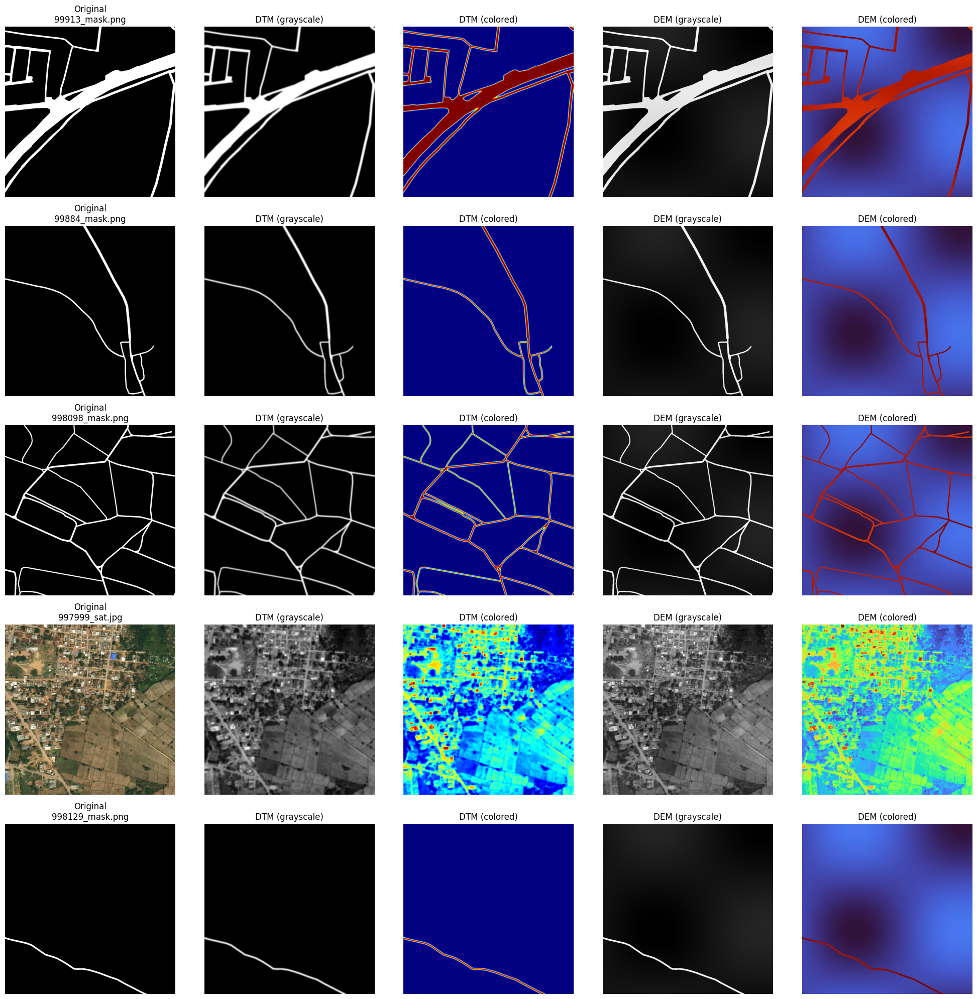

Successfully generated and displayed 5 DTM and DEM examples.


In [ ]:
def generate_dtm(input_image_path, output_path, resolution=30):
    """
    Generate a Digital Terrain Model (DTM) from an input image.
    """
    # Read the image
    img = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Error loading image: {input_image_path}")
        return False, None, None

    # Apply a Gaussian blur to simulate terrain smoothness
    dtm = cv2.GaussianBlur(img, (15, 15), 0)

    # Apply morphological operations to enhance terrain features
    kernel = np.ones((5, 5), np.uint8)
    dtm = cv2.morphologyEx(dtm, cv2.MORPH_CLOSE, kernel)

    # Normalize to 0-255 range
    dtm = cv2.normalize(dtm, None, 0, 255, cv2.NORM_MINMAX)

    # Save the DTM
    filename = os.path.basename(input_image_path)
    dtm_path = os.path.join(output_path, f"dtm_{filename}")
    cv2.imwrite(dtm_path, dtm)

    # Create a false-color visualization
    dtm_colored = cv2.applyColorMap(dtm, cv2.COLORMAP_JET)
    dtm_colored_path = os.path.join(output_path, f"dtm_colored_{filename}")
    cv2.imwrite(dtm_colored_path, dtm_colored)

    return True, dtm, dtm_colored

def generate_dem(input_image_path, output_path, resolution=30):
    """
    Generate a Digital Elevation Model (DEM) from an input image.
    """
    # Read the image
    img = cv2.imread(input_image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Error loading image: {input_image_path}")
        return False, None, None

    # Apply median filter to reduce noise
    dem = cv2.medianBlur(img, 5)

    # Add some height variation with a frequency pattern
    rows, cols = dem.shape
    X, Y = np.meshgrid(np.linspace(0, 5, cols), np.linspace(0, 5, rows))
    elevation_pattern = 20 * np.sin(X) * np.cos(Y)

    # Add the pattern to our base image
    dem = dem.astype(np.float32) + elevation_pattern

    # Normalize to 0-255 range
    dem = cv2.normalize(dem, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Save the DEM
    filename = os.path.basename(input_image_path)
    dem_path = os.path.join(output_path, f"dem_{filename}")
    cv2.imwrite(dem_path, dem)

    # Create a false-color visualization with different colormap
    dem_colored = cv2.applyColorMap(dem, cv2.COLORMAP_TURBO)
    dem_colored_path = os.path.join(output_path, f"dem_colored_{filename}")
    cv2.imwrite(dem_colored_path, dem_colored)

    return True, dem, dem_colored

def generate_and_display_first_n(n=5):
    """
    Generate and display the first n DTM and DEM images
    """
    # Get the first n images
    images = []
    image_paths = []

    # Try to find images in each category and split
    for category in CATEGORIES.keys():
        # Try train, test, and valid splits
        for split in ['train', 'test', 'valid']:
            source_dir = os.path.join(BASE_PATH, category, split)
            if not os.path.exists(source_dir):
                continue

            # Get files from this directory
            files = [os.path.join(source_dir, f) for f in os.listdir(source_dir)
                    if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.tiff'))]

            # Add to our image paths
            image_paths.extend(files)

            # If we have enough images, break out of the loops
            if len(image_paths) >= n:
                image_paths = image_paths[:n]  # Keep only the first n
                break

        if len(image_paths) >= n:
            break

    # If we don't have enough images, print a warning
    if len(image_paths) < n:
        print(f"Warning: Found only {len(image_paths)} images, less than the requested {n}")

    # Process the images
    results = []
    for img_path in image_paths:
        # Generate DTM
        dtm_success, dtm, dtm_colored = generate_dtm(img_path, DTM_OUTPUT_PATH)

        # Generate DEM
        dem_success, dem, dem_colored = generate_dem(img_path, DEM_OUTPUT_PATH)

        if dtm_success and dem_success:
            # Read the original image
            original = cv2.imread(img_path)
            original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for display

            # Store the results
            results.append({
                'path': img_path,
                'original': original,
                'dtm': dtm,
                'dtm_colored': dtm_colored,
                'dem': dem,
                'dem_colored': dem_colored
            })

    # Display the results
    fig = plt.figure(figsize=(20, 4 * len(results)))

    for i, result in enumerate(results):
        # Original image
        plt.subplot(len(results), 5, i*5 + 1)
        plt.imshow(result['original'])
        plt.title(f"Original\n{os.path.basename(result['path'])}")
        plt.axis('off')

        # DTM
        plt.subplot(len(results), 5, i*5 + 2)
        plt.imshow(result['dtm'], cmap='gray')
        plt.title("DTM (grayscale)")
        plt.axis('off')

        # DTM colored
        plt.subplot(len(results), 5, i*5 + 3)
        plt.imshow(cv2.cvtColor(result['dtm_colored'], cv2.COLOR_BGR2RGB))
        plt.title("DTM (colored)")
        plt.axis('off')

        # DEM
        plt.subplot(len(results), 5, i*5 + 4)
        plt.imshow(result['dem'], cmap='gray')
        plt.title("DEM (grayscale)")
        plt.axis('off')

        # DEM colored
        plt.subplot(len(results), 5, i*5 + 5)
        plt.imshow(cv2.cvtColor(result['dem_colored'], cv2.COLOR_BGR2RGB))
        plt.title("DEM (colored)")
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_PATH, 'dtm_dem_examples.png'))
    plt.show()

    return results

# Execute the function to generate and display the first 5 images
generated_results = generate_and_display_first_n(5)
print(f"Successfully generated and displayed {len(generated_results)} DTM and DEM examples.")

In [ ]:
#######################
# Landsat Processing #
#######################

def download_landsat_data(lat, lon, start_date, end_date, output_dir=LANDSAT_OUTPUT_PATH,
                          username='your_username', password='your_password',
                          dataset='landsat_8_c1', max_results=10):
    """
    Download Landsat imagery for a specific location and date range

    Note: You need to register at https://earthexplorer.usgs.gov/ and use your credentials
    """
    print(f"Searching for Landsat data at coordinates ({lat}, {lon}) from {start_date} to {end_date}")

    # Initialize the API
    api = API(username, password)

    try:
        # Search for Landsat scenes
        scenes = api.search(
            dataset=dataset,
            latitude=lat,
            longitude=lon,
            start_date=start_date,
            end_date=end_date,
            max_results=max_results
        )

        print(f"Found {len(scenes)} Landsat scenes")

        if not scenes:
            print("No scenes found matching criteria.")
            return []

        # Initialize the EarthExplorer downloader
        ee = EarthExplorer(username, password)

        downloaded_files = []

        # Download scenes
        for scene in scenes:
            scene_id = scene['entity_id']
            print(f"Downloading scene {scene_id}...")

            try:
                output_file = ee.download(scene_id, output_dir)
                downloaded_files.append(output_file)
                print(f"Downloaded to {output_file}")
            except Exception as e:
                print(f"Error downloading scene {scene_id}: {e}")

        # Logout
        ee.logout()
        api.logout()

        return downloaded_files

    except Exception as e:
        print(f"Error accessing Landsat data: {e}")
        # Ensure logout
        try:
            api.logout()
        except:
            pass
        return []

def process_landsat_image(landsat_path, output_dir=LANDSAT_OUTPUT_PATH):
    """
    Process a Landsat image tar.gz file and create different band combinations
    """
    import tarfile
    import glob

    # Extract the tar.gz file
    if landsat_path.endswith('.tar.gz'):
        extract_dir = os.path.join(output_dir, 'temp_extract')
        os.makedirs(extract_dir, exist_ok=True)

        with tarfile.open(landsat_path) as tar:
            tar.extractall(path=extract_dir)

        # Find the extracted TIF files
        tif_files = glob.glob(os.path.join(extract_dir, '*.TIF'))

        # Group bands
        bands = {}
        for tif in tif_files:
            basename = os.path.basename(tif)
            if 'B1' in basename:
                bands['B1'] = tif  # Coastal/Aerosol
            elif 'B2' in basename:
                bands['B2'] = tif  # Blue
            elif 'B3' in basename:
                bands['B3'] = tif  # Green
            elif 'B4' in basename:
                bands['B4'] = tif  # Red
            elif 'B5' in basename:
                bands['B5'] = tif  # NIR
            elif 'B6' in basename:
                bands['B6'] = tif  # SWIR 1
            elif 'B7' in basename:
                bands['B7'] = tif  # SWIR 2
            elif 'B8' in basename:
                bands['B8'] = tif  # Panchromatic
            elif 'B9' in basename:
                bands['B9'] = tif  # Cirrus
            elif 'B10' in basename:
                bands['B10'] = tif  # TIRS 1
            elif 'B11' in basename:
                bands['B11'] = tif  # TIRS 2

        # Create different band combinations
        # Example: Create true color composite (RGB = 4-3-2)
        if all(band in bands for band in ['B4', 'B3', 'B2']):
            create_composite_image(
                red_band=bands['B4'],
                green_band=bands['B3'],
                blue_band=bands['B2'],
                output_path=os.path.join(output_dir, f"{os.path.basename(landsat_path)}_true_color.png")
            )

        # Example: Create false color composite (NIR-Red-Green = 5-4-3)
        if all(band in bands for band in ['B5', 'B4', 'B3']):
            create_composite_image(
                red_band=bands['B5'],
                green_band=bands['B4'],
                blue_band=bands['B3'],
                output_path=os.path.join(output_dir, f"{os.path.basename(landsat_path)}_false_color.png")
            )

        # Example: NDVI calculation
        if all(band in bands for band in ['B5', 'B4']):
            calculate_ndvi(
                nir_band=bands['B5'],
                red_band=bands['B4'],
                output_path=os.path.join(output_dir, f"{os.path.basename(landsat_path)}_ndvi.png")
            )

        # Clean up temporary extraction directory
        shutil.rmtree(extract_dir)

        return True
    else:
        print(f"Error: {landsat_path} is not a tar.gz file")
        return False

def create_composite_image(red_band, green_band, blue_band, output_path):
    """
    Create a composite RGB image from Landsat bands
    """
    try:
        # Open bands
        with rasterio.open(red_band) as red_src, \
             rasterio.open(green_band) as green_src, \
             rasterio.open(blue_band) as blue_src:

            # Read the bands
            red = red_src.read(1).astype(np.float32)
            green = green_src.read(1).astype(np.float32)
            blue = blue_src.read(1).astype(np.float32)

            # Normalize each band to 0-255
            def normalize(band):
                min_val = np.percentile(band, 2)
                max_val = np.percentile(band, 98)
                return np.clip((band - min_val) * 255.0 / (max_val - min_val), 0, 255).astype(np.uint8)

            red_norm = normalize(red)
            green_norm = normalize(green)
            blue_norm = normalize(blue)

            # Create RGB composite
            rgb = np.dstack((red_norm, green_norm, blue_norm))

            # Save the image
            cv2.imwrite(output_path, cv2.cvtColor(rgb, cv2.COLOR_RGB2BGR))

            print(f"Saved composite image to {output_path}")
            return output_path

    except Exception as e:
        print(f"Error creating composite image: {e}")
        return None

def calculate_ndvi(nir_band, red_band, output_path):
    """
    Calculate NDVI (Normalized Difference Vegetation Index) from NIR and Red bands
    """
    try:
        # Open bands
        with rasterio.open(nir_band) as nir_src, \
             rasterio.open(red_band) as red_src:

            # Read the bands
            nir = nir_src.read(1).astype(np.float32)
            red = red_src.read(1).astype(np.float32)

            # Calculate NDVI
            # NDVI = (NIR - Red) / (NIR + Red)
            # Add a small number to avoid division by zero
            epsilon = 1e-10
            ndvi = (nir - red) / (nir + red + epsilon)

            # NDVI values range from -1 to 1
            # Scale to 0-255 for visualization
            ndvi_scaled = ((ndvi + 1) / 2 * 255).astype(np.uint8)

            # Apply a colormap for better visualization
            ndvi_colored = cv2.applyColorMap(ndvi_scaled, cv2.COLORMAP_JET)

            # Save the NDVI image
            cv2.imwrite(output_path, ndvi_colored)

            # Also save the raw NDVI (grayscale)
            cv2.imwrite(output_path.replace('.png', '_raw.png'), ndvi_scaled)

            print(f"Saved NDVI image to {output_path}")
            return output_path

    except Exception as e:
        print(f"Error calculating NDVI: {e}")
        return None

def simulate_landsat_for_wwtp_detection(input_image_path, output_dir=LANDSAT_OUTPUT_PATH):
    """
    Simulate Landsat-like images for WWTP detection
    This function creates false-color composites that highlight water and infrastructure
    """
    try:
        # Read the image
        img = cv2.imread(input_image_path)
        if img is None:
            print(f"Error loading image: {input_image_path}")
            return None

        # Split into BGR channels
        b, g, r = cv2.split(img)

        # Create a simulated NIR band (for demonstration)
        # In real scenarios, this would be actual NIR data from Landsat
        simulated_nir = cv2.addWeighted(r, 0.7, g, 0.3, 0)

        # Enhance the NIR to simulate vegetation response
        simulated_nir = cv2.equalizeHist(simulated_nir)

        # Create a SWIR band simulation (sensitive to moisture)
        simulated_swir = cv2.addWeighted(b, 0.6, r, 0.4, 0)
        simulated_swir = cv2.GaussianBlur(simulated_swir, (3, 3), 0)

        # Calculate simulated NDWI (Normalized Difference Water Index)
        # NDWI = (Green - NIR) / (Green + NIR)
        epsilon = 1e-10
        green_float = g.astype(np.float32)
        nir_float = simulated_nir.astype(np.float32)
        ndwi = (green_float - nir_float) / (green_float + nir_float + epsilon)
        ndwi_scaled = ((ndwi + 1) / 2 * 255).astype(np.uint8)

        # Create highlighted water features
        water_highlighted = cv2.applyColorMap(ndwi_scaled, cv2.COLORMAP_OCEAN)

        # Create false color composite for WWTP detection
        # Using NIR-Red-Green combination which highlights vegetation in red and water in dark blue
        false_color = np.dstack((simulated_nir, r, g))

        # Create enhanced composite highlighting infrastructure and water
        # This combination makes infrastructure appear bright and water appear dark
        infra_water = np.dstack((simulated_swir, b, ndwi_scaled))

        # Get the filename
        filename = os.path.basename(input_image_path)
        base_name = os.path.splitext(filename)[0]

        # Save the generated images
        cv2.imwrite(os.path.join(output_dir, f"{base_name}_ndwi.png"), ndwi_scaled)
        cv2.imwrite(os.path.join(output_dir, f"{base_name}_water_highlighted.png"), water_highlighted)
        cv2.imwrite(os.path.join(output_dir, f"{base_name}_false_color.png"), false_color)
        cv2.imwrite(os.path.join(output_dir, f"{base_name}_infra_water.png"), infra_water)

        # Create a combined visualization to highlight potential WWTP features
        # WWTPs often have distinct water treatment ponds and infrastructure
        kernel = np.ones((3, 3), np.uint8)
        water_mask = cv2.threshold(ndwi_scaled, 170, 255, cv2.THRESH_BINARY)[1]
        water_mask = cv2.dilate(water_mask, kernel, iterations=1)

        # Find potential treatment pond structures (rounded shapes)
        # In real apps, more sophisticated object detection would be used
        contours, _ = cv2.findContours(water_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        wwtp_features = np.zeros_like(img)

        for contour in contours:
            area = cv2.contourArea(contour)
            if 500 < area < 10000:  # Filter by area size typical of treatment ponds
                perimeter = cv2.arcLength(contour, True)
                # Check circularity - treatment ponds are often circular or oval
                circularity = 4 * np.pi * area / (perimeter * perimeter) if perimeter > 0 else 0
                if circularity > 0.4:  # Threshold for circular/oval shapes
                    cv2.drawContours(wwtp_features, [contour], -1, (0, 255, 255), 2)

        # Overlay potential WWTP features on the original image
        wwtp_detection = cv2.addWeighted(img, 0.7, wwtp_features, 0.3, 0)
        cv2.imwrite(os.path.join(output_dir, f"{base_name}_wwtp_detection.png"), wwtp_detection)

        # Return paths to the generated images
        return {
            'ndwi': os.path.join(output_dir, f"{base_name}_ndwi.png"),
            'water_highlighted': os.path.join(output_dir, f"{base_name}_water_highlighted.png"),
            'false_color': os.path.join(output_dir, f"{base_name}_false_color.png"),
            'infra_water': os.path.join(output_dir, f"{base_name}_infra_water.png"),
            'wwtp_detection': os.path.join(output_dir, f"{base_name}_wwtp_detection.png")
        }

    except Exception as e:
        print(f"Error generating simulated Landsat images: {e}")
        return None

def process_all_images_for_landsat():
    """Process all images to create simulated Landsat images"""
    for category in CATEGORIES.keys():
        for split in ['train', 'valid', 'test']:
            source_dir = os.path.join(BASE_PATH, category, split)
            if not os.path.exists(source_dir):
                print(f"Directory does not exist: {source_dir}")
                continue

            print(f"Processing {category}/{split} for Landsat simulation...")
            files = os.listdir(source_dir)

            for idx, filename in enumerate(files):
                if idx % 10 == 0:
                    print(f"Processing {idx}/{len(files)}...")

                img_path = os.path.join(source_dir, filename)

                # Create simulated Landsat products
                simulate_landsat_for_wwtp_detection(img_path, LANDSAT_OUTPUT_PATH)
# Process images to generate simulated Landsat imagery
print("Generating simulated Landsat imagery...")
process_all_images_for_landsat()

Generating simulated Landsat imagery...
Processing NONWWTP/train for Landsat simulation...
Processing 0/259...
Processing 10/259...
Processing 20/259...
Processing 30/259...
Processing 40/259...
Processing 50/259...
Processing 60/259...
Processing 70/259...
Processing 80/259...
Processing 90/259...
Processing 100/259...
Processing 110/259...
Processing 120/259...
Processing 130/259...
Processing 140/259...
Processing 150/259...
Processing 160/259...
Processing 170/259...
Processing 180/259...
Processing 190/259...
Processing 200/259...
Processing 210/259...
Processing 220/259...
Processing 230/259...
Processing 240/259...
Processing 250/259...
Processing NONWWTP/valid for Landsat simulation...
Processing 0/992...
Processing 10/992...
Processing 20/992...
Processing 30/992...
Processing 40/992...
Processing 50/992...
Processing 60/992...
Processing 70/992...
Processing 80/992...
Processing 90/992...
Processing 100/992...
Processing 110/992...
Processing 120/992...
Processing 130/992...


In [ ]:
# Load data from directories
print("Loading data...")
X_train, y_train = load_data("train")
X_val, y_val = load_data("valid")
X_test, y_test = load_data("test")

# Convert data format
print("Preparing data...")
X_train = X_train.astype('float32') / 255.0
X_val = X_val.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0

# Convert labels to categorical
y_train_cat = to_categorical(y_train, num_classes=NUM_CLASSES)
y_val_cat = to_categorical(y_val, num_classes=NUM_CLASSES)
y_test_cat = to_categorical(y_test, num_classes=NUM_CLASSES)

# Print dataset information
print(f"Training set: {X_train.shape[0]} samples")
print(f"Validation set: {X_val.shape[0]} samples")
print(f"Test set: {X_test.shape[0]} samples")

Loading data...
Loading 259 images from /content/drive/MyDrive/HKP/data/NONWWTP/train
Loading 54 images from /content/drive/MyDrive/HKP/data/WWTP/train
Loading 992 images from /content/drive/MyDrive/HKP/data/NONWWTP/valid
Loading 11 images from /content/drive/MyDrive/HKP/data/WWTP/valid
Loading 1106 images from /content/drive/MyDrive/HKP/data/NONWWTP/test
Loading 24 images from /content/drive/MyDrive/HKP/data/WWTP/test
Preparing data...
Training set: 308 samples
Validation set: 1003 samples
Test set: 1130 samples


In [ ]:
###########################
# Model Building Functions #
###########################

def build_classification_model(input_shape=(224, 224, 3), num_classes=2):
    """
    Build a CNN model for classification using EfficientNetB0 as backbone
    """
    # Use EfficientNetB0 as the base model with pre-trained weights
    base_model = EfficientNetB0(
        weights='imagenet',
        include_top=False,
        input_shape=input_shape
    )

    # Add custom layers on top
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.2)(x)

    # Output layer depends on number of classes
    outputs = Dense(num_classes, activation='softmax')(x)

    # Create the model
    model = Model(inputs=base_model.input, outputs=outputs)

    # Freeze the base model layers
    for layer in base_model.layers:
        layer.trainable = False

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=LEARNING_RATE),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

def create_data_generators():
    """
    Create data generators for training, validation, and testing
    """
    from tensorflow.keras.preprocessing.image import ImageDataGenerator

    # Create augmentation for training
    train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    # Only rescale for validation and testing
    valid_datagen = ImageDataGenerator(rescale=1./255)
    test_datagen = ImageDataGenerator(rescale=1./255)

    # Set up the generators
    train_generator = train_datagen.flow_from_directory(
        os.path.join(BASE_PATH, 'train'),
        target_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=True
    )

    validation_generator = valid_datagen.flow_from_directory(
        os.path.join(BASE_PATH, 'valid'),
        target_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False
    )

    test_generator = test_datagen.flow_from_directory(
        os.path.join(BASE_PATH, 'test'),
        target_size=IMG_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False
    )

    return train_generator, validation_generator, test_generator

def train_model_with_generators(model, train_generator, validation_generator, epochs=EPOCHS):
    """
    Train the model using data generators
    """
    # Set up callbacks
    checkpoint = ModelCheckpoint(
        os.path.join(MODEL_PATH, 'best_model.h5'),
        monitor='val_accuracy',
        save_best_only=True,
        mode='max',
        verbose=1
    )

    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True,
        verbose=1
    )

    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-6,
        verbose=1
    )

    # Train the model
    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=validation_generator,
        callbacks=[checkpoint, early_stopping, reduce_lr]
    )

    return model, history
# Build model
print("Building model...")
model = build_classification_model(input_shape=IMG_SIZE + (3,), num_classes=NUM_CLASSES)
model.summary()

Building model...


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_2         │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization_1     │ (None, 224, 224,  │          7 │ rescaling_2[0][0] │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_3         │ (None, 224, 224,  │          0 │ normalization_1[… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_3[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,410,661 (16.83 MB)

 Trainable params: 361,090 (1.38 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

Training model...
Epoch 1/25
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6456 - loss: 0.6072
Epoch 1: val_accuracy improved from -inf to 0.98903, saving model to /content/drive/MyDrive/HKP/data/output/models/best_model.h5


10/10 ━━━━━━━━━━━━━━━━━━━━ 132s 13s/step - accuracy: 0.6571 - loss: 0.5998 - val_accuracy: 0.9890 - val_loss: 0.1819 - learning_rate: 0.0010
Epoch 2/25
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8566 - loss: 0.4360
Epoch 2: val_accuracy did not improve from 0.98903
10/10 ━━━━━━━━━━━━━━━━━━━━ 105s 11s/step - accuracy: 0.8552 - loss: 0.4381 - val_accuracy: 0.9890 - val_loss: 0.2265 - learning_rate: 0.0010
Epoch 3/25
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8572 - loss: 0.4508
Epoch 3: val_accuracy did not improve from 0.98903
10/10 ━━━━━━━━━━━━━━━━━━━━ 143s 11s/step - accuracy: 0.8557 - loss: 0.4548 - val_accuracy: 0.9890 - val_loss: 0.1851 - learning_rate: 0.0010
Epoch 4/25
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8062 - loss: 0.5302
Epoch 4: val_accuracy did not improve from 0.98903
10/10 ━━━━━━━━━━━━━━━━━━━━ 145s 12s/step - accuracy: 0.8090 - loss: 0.5259 - val_accuracy: 0.9890 - val_loss: 0.2042 - learning_rate: 0.0010
Epoch 5/25
10/10 ━━━━━━━━━━━━━━━━━

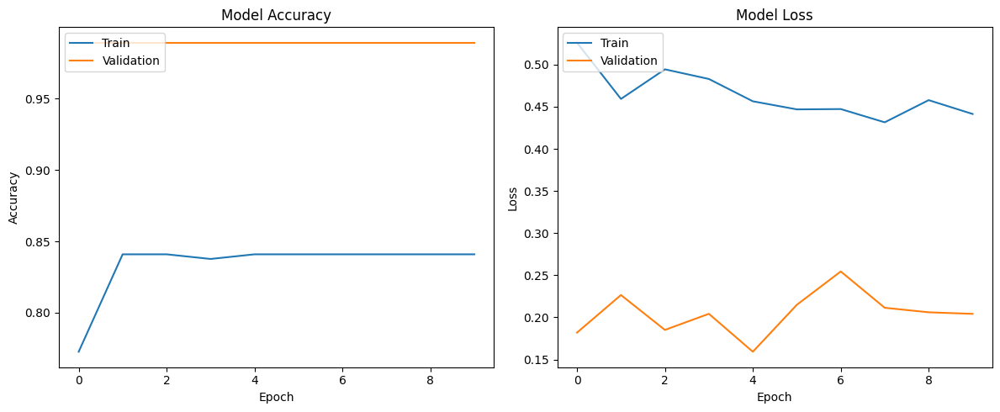

In [ ]:
# Train model
print("Training model...")
history = model.fit(
    X_train, y_train_cat,
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=(X_val, y_val_cat),
    callbacks=[
        ModelCheckpoint(
            os.path.join(MODEL_PATH, 'best_model.h5'),
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        ),
        EarlyStopping(
            monitor='val_loss',
            patience=5,
            restore_best_weights=True
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=3,
            min_lr=1e-6
        )
    ]
)

# Plot training history
plot_training_history(history)

# Save the model
model.save(os.path.join(MODEL_PATH, 'final_model.h5'))

Fine-tuning model...
Epoch 1/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8421 - loss: 0.4368
Epoch 1: val_accuracy improved from -inf to 0.98903, saving model to /content/drive/MyDrive/HKP/data/output/models/fine_tuned_model.h5


20/20 ━━━━━━━━━━━━━━━━━━━━ 131s 6s/step - accuracy: 0.8420 - loss: 0.4372 - val_accuracy: 0.9890 - val_loss: 0.1856
Epoch 2/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8527 - loss: 0.4204
Epoch 2: val_accuracy did not improve from 0.98903
20/20 ━━━━━━━━━━━━━━━━━━━━ 114s 5s/step - accuracy: 0.8522 - loss: 0.4214 - val_accuracy: 0.9890 - val_loss: 0.1615
Epoch 3/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8217 - loss: 0.4768
Epoch 3: val_accuracy did not improve from 0.98903
20/20 ━━━━━━━━━━━━━━━━━━━━ 102s 5s/step - accuracy: 0.8226 - loss: 0.4752 - val_accuracy: 0.9890 - val_loss: 0.2059
Epoch 4/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8321 - loss: 0.4545
Epoch 4: val_accuracy did not improve from 0.98903
20/20 ━━━━━━━━━━━━━━━━━━━━ 105s 5s/step - accuracy: 0.8326 - loss: 0.4536 - val_accuracy: 0.9890 - val_loss: 0.1780
Epoch 5/10
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8404 - loss: 0.4618
Epoch 5: val_accuracy did not improve from 0.98903


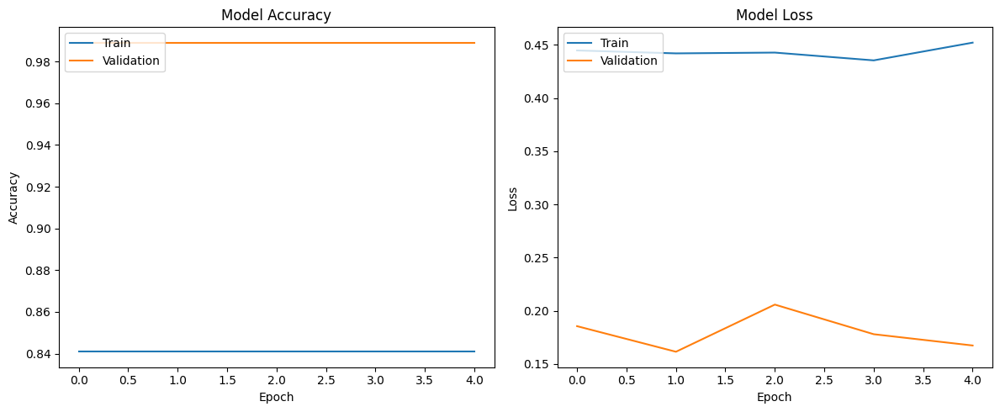

In [ ]:
def fine_tune_model(model, train_generator, validation_generator, epochs=5):
    """
    Fine-tune the model by unfreezing the top layers of the base model
    """
    # Unfreeze some layers for fine-tuning
    base_model = model.layers[1]  # EfficientNetB0

    # Unfreeze the top 30 layers
    for layer in base_model.layers[-30:]:
        layer.trainable = True

    # Recompile with lower learning rate
    model.compile(
        optimizer=Adam(learning_rate=LEARNING_RATE/10),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    # Continue training
    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=validation_generator,
        callbacks=[
            ModelCheckpoint(
                os.path.join(MODEL_PATH, 'fine_tuned_model.h5'),
                monitor='val_accuracy',
                save_best_only=True,
                mode='max',
                verbose=1
            ),
            EarlyStopping(
                monitor='val_loss',
                patience=3,
                restore_best_weights=True,
                verbose=1
            )
        ]
    )

    return model, history

def plot_training_history(history):
    """
    Plot the training and validation loss and accuracy
    """
    plt.figure(figsize=(12, 5))

    # Plot training & validation accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(['Train', 'Validation'], loc='upper left')

    # Plot training & validation loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(['Train', 'Validation'], loc='upper left')

    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_PATH, 'training_history.png'))
    plt.show()

 # Fine-tune the model
print("Fine-tuning model...")
# Recompile with a lower learning rate
model.compile(
    optimizer=Adam(learning_rate=LEARNING_RATE/10),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Continue training
fine_tune_history = model.fit(
    X_train, y_train_cat,
    batch_size=BATCH_SIZE // 2,  # Smaller batch size for fine-tuning
    epochs=10,
    validation_data=(X_val, y_val_cat),
    callbacks=[
        ModelCheckpoint(
            os.path.join(MODEL_PATH, 'fine_tuned_model.h5'),
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        ),
        EarlyStopping(
            monitor='val_loss',
            patience=3,
            restore_best_weights=True
        )
    ]
)

# Plot fine-tuning history
plot_training_history(fine_tune_history)

# Save the fine-tuned model
model.save('fine_tuned_final_model.h5')

Evaluating model on test set...
36/36 ━━━━━━━━━━━━━━━━━━━━ 88s 2s/step
Test Accuracy: 0.9788
Test Precision: 0.9580
Test Recall: 0.9788
Test F1 Score: 0.9683

Classification Report:
              precision    recall  f1-score   support

     NONWWTP       0.98      1.00      0.99      1106
        WWTP       0.00      0.00      0.00        24

    accuracy                           0.98      1130
   macro avg       0.49      0.50      0.49      1130
weighted avg       0.96      0.98      0.97      1130



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

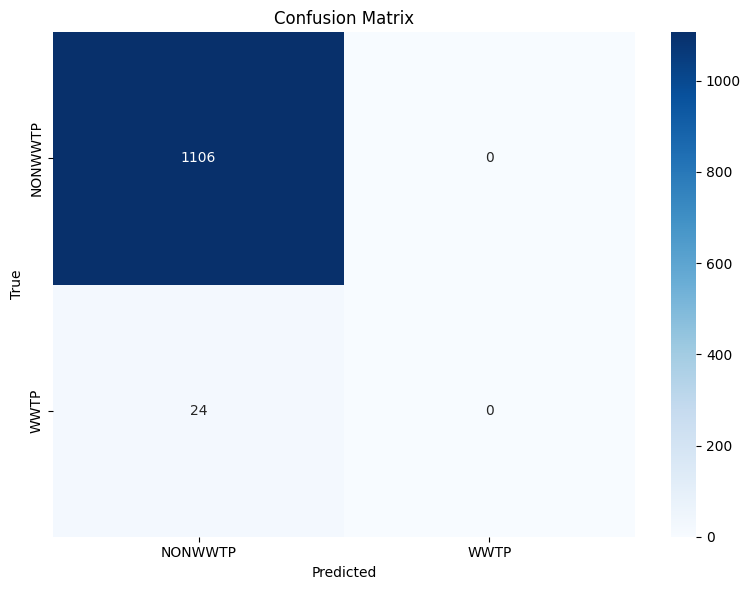

Visualizing predictions on test images...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


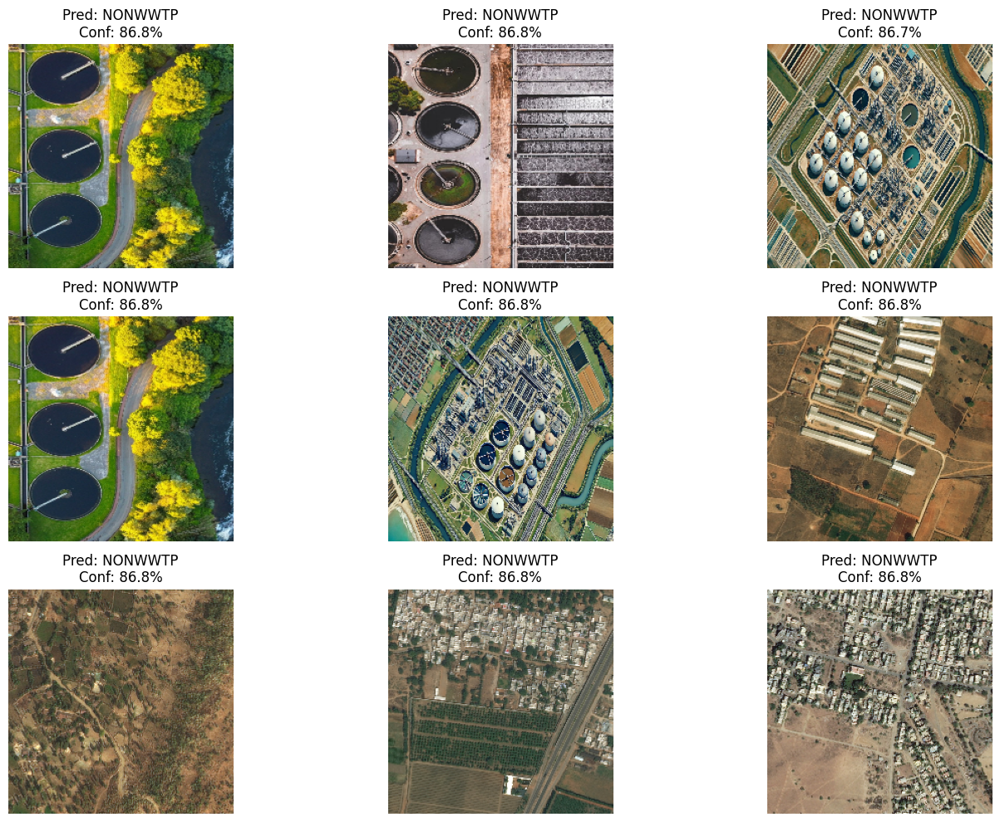

Complete! Model, DTMs, DEMs, and Landsat imagery have been processed and saved.


In [ ]:
def evaluate_model(model, test_generator):
    """
    Evaluate the model on the test set
    """
    # Get predictions
    test_generator.reset()
    predictions = model.predict(test_generator, verbose=1)
    y_pred = np.argmax(predictions, axis=1)

    # Get true labels
    y_true = test_generator.classes

    # Calculate metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')

    # Print metrics
    print(f"Test Accuracy: {accuracy:.4f}")
    print(f"Test Precision: {precision:.4f}")
    print(f"Test Recall: {recall:.4f}")
    print(f"Test F1 Score: {f1:.4f}")

    # Generate classification report
    print("\nClassification Report:")
    class_names = list(test_generator.class_indices.keys())
    print(classification_report(y_true, y_pred, target_names=class_names))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names,
                yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_PATH, 'confusion_matrix.png'))
    plt.show()

    return accuracy, precision, recall, f1

def visualize_model_predictions(model, image_paths, output_dir=OUTPUT_PATH):
    """
    Visualize model predictions on sample images
    """
    plt.figure(figsize=(15, 10))

    for i, img_path in enumerate(image_paths[:9]):  # Show up to 9 images
        # Load and preprocess the image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        img_resized = cv2.resize(img, IMG_SIZE)
        img_norm = img_resized / 255.0
        img_batch = np.expand_dims(img_norm, axis=0)

        # Get prediction
        pred = model.predict(img_batch)[0]
        predicted_class = np.argmax(pred)
        confidence = pred[predicted_class] * 100

        # Get class name
        class_names = list(CATEGORIES.keys())
        predicted_label = class_names[predicted_class]

        # Plot the image
        plt.subplot(3, 3, i+1)
        plt.imshow(img_resized)
        plt.title(f"Pred: {predicted_label}\nConf: {confidence:.1f}%")
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, 'prediction_visualization.png'))
    plt.show()


# Evaluate on test set
print("Evaluating model on test set...")
# Get predictions
y_pred_prob = model.predict(X_test)
y_pred = np.argmax(y_pred_prob, axis=1)
y_true = np.argmax(y_test_cat, axis=1)

# Calculate metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

# Print metrics
print(f"Test Accuracy: {accuracy:.4f}")
print(f"Test Precision: {precision:.4f}")
print(f"Test Recall: {recall:.4f}")
print(f"Test F1 Score: {f1:.4f}")

# Print classification report
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=list(CATEGORIES.keys())))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(CATEGORIES.keys()),
            yticklabels=list(CATEGORIES.keys()))
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_PATH, 'test_confusion_matrix.png'))
plt.show()

# Visualize some predictions
print("Visualizing predictions on test images...")
# Select a few test images
test_image_paths = [os.path.join(BASE_PATH, "WWTP", "test", f) for f in os.listdir(os.path.join(BASE_PATH, "WWTP", "test"))[:5]]
test_image_paths += [os.path.join(BASE_PATH, "NONWWTP", "test", f) for f in os.listdir(os.path.join(BASE_PATH, "NONWWTP", "test"))[:4]]

# Visualize predictions
visualize_model_predictions(model, test_image_paths)

print("Complete! Model, DTMs, DEMs, and Landsat imagery have been processed and saved.")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

=== Step 1: Analyzing Dataset Distribution ===
Dataset Distribution:

NONWWTP:
  train: 259 images
  valid: 992 images
  test: 1106 images

WWTP:
  train: 54 images
  valid: 11 images
  test: 24 images

Training set WWTP ratio: 0.17 (54/313)


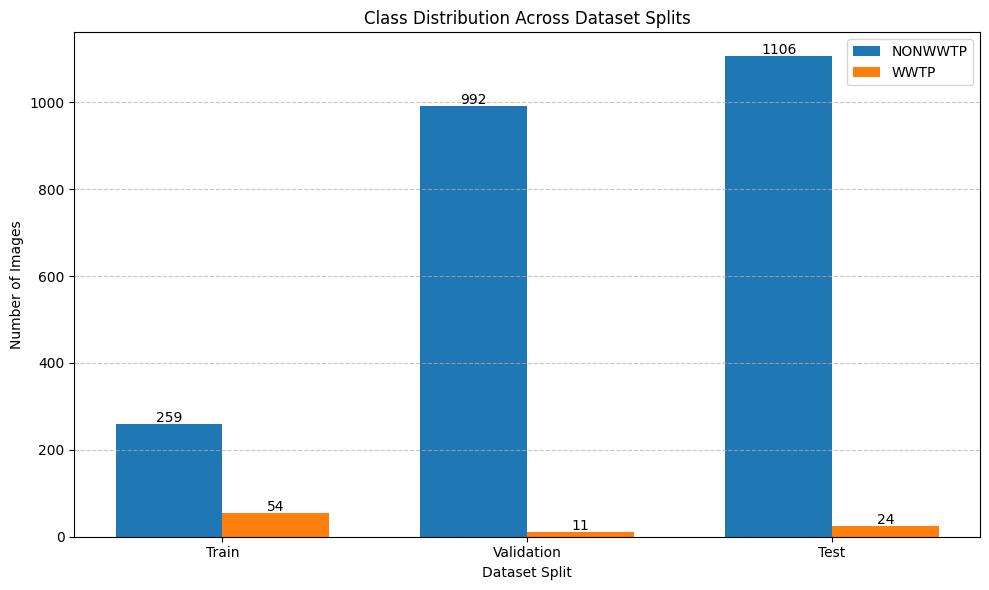


=== Step 2: Loading Balanced Data ===
Balanced dataset not found. Creating one...
Dataset Distribution:

NONWWTP:
  train: 259 images
  valid: 992 images
  test: 1106 images

WWTP:
  train: 54 images
  valid: 11 images
  test: 24 images

Training set WWTP ratio: 0.17 (54/313)


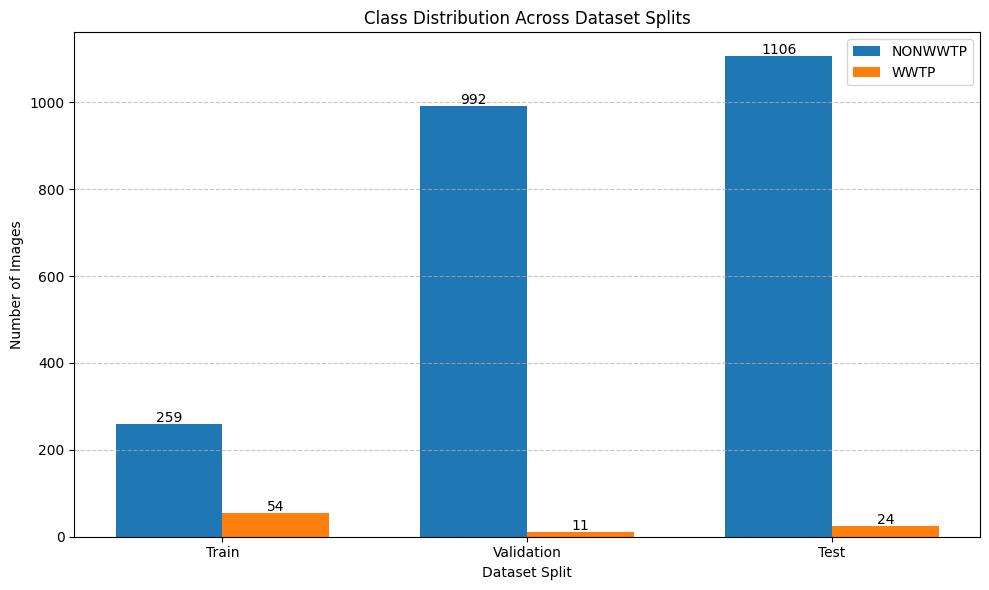


Augmentation factors needed for WWTP images:
  train: 5x
  valid: 91x
  test: 47x
Processing 259 NONWWTP images for train
Processing 54 WWTP images for train
  Processed 10/54 images with 4 augmentations each
  Processed 20/54 images with 4 augmentations each
  Processed 30/54 images with 4 augmentations each
  Processed 40/54 images with 4 augmentations each
  Processed 50/54 images with 4 augmentations each
Processing 992 NONWWTP images for valid
Processing 11 WWTP images for valid
  Processed 10/11 images with 90 augmentations each
Processing 1106 NONWWTP images for test
Processing 24 WWTP images for test
  Processed 10/24 images with 46 augmentations each
  Processed 20/24 images with 46 augmentations each

Balanced dataset created successfully!
Loading data from balanced dataset...
Loading 259 NONWWTP images from train
Loading 992 NONWWTP images from valid
Loading 1106 NONWWTP images from test
Loading 245 WWTP images from train
Loading 1001 WWTP images from valid
Loading 1128 WWT

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit

 Total params: 4,870,949 (18.58 MB)

 Trainable params: 4,661,214 (17.78 MB)

 Non-trainable params: 209,735 (819.28 KB)


Starting model training with data augmentation...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5017 - auc: 0.5108 - loss: 0.9688 - precision: 0.5017 - recall: 0.5017
Epoch 1: val_recall improved from -inf to 0.49950, saving model to /content/drive/MyDrive/HKP/data/output/models/checkpoints/model_epoch_01_val_recall_0.50.h5


31/31 ━━━━━━━━━━━━━━━━━━━━ 259s 7s/step - accuracy: 0.5018 - auc: 0.5108 - loss: 0.9683 - precision: 0.5018 - recall: 0.5018 - val_accuracy: 0.4995 - val_auc: 0.5295 - val_loss: 0.6944 - val_precision: 0.4995 - val_recall: 0.4995 - learning_rate: 1.0000e-04
Epoch 2/25
 1/31 ━━━━━━━━━━━━━━━━━━━━ 57s 2s/step - accuracy: 0.4375 - auc: 0.6406 - loss: 0.6918 - precision: 0.4375 - recall: 0.4375

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 2: val_recall did not improve from 0.49950
31/31 ━━━━━━━━━━━━━━━━━━━━ 139s 5s/step - accuracy: 0.4375 - auc: 0.6406 - loss: 0.6918 - precision: 0.4375 - recall: 0.4375 - val_accuracy: 0.4995 - val_auc: 0.5257 - val_loss: 0.6944 - val_precision: 0.4995 - val_recall: 0.4995 - learning_rate: 1.0000e-04
Epoch 3/25
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5522 - auc: 0.5719 - loss: 0.8744 - precision: 0.5522 - recall: 0.5522
Epoch 3: val_recall did not improve from 0.49950
31/31 ━━━━━━━━━━━━━━━━━━━━ 235s 7s/step - accuracy: 0.5520 - auc: 0.5717 - loss: 0.8745 - precision: 0.5520 - recall: 0.5520 - val_accuracy: 0.4995 - val_auc: 0.5159 - val_loss: 0.6945 - val_precision: 0.4995 - val_recall: 0.4995 - learning_rate: 1.0000e-04
Epoch 4/25
 1/31 ━━━━━━━━━━━━━━━━━━━━ 1:01 2s/step - accuracy: 0.6875 - auc: 0.7695 - loss: 0.5857 - precision: 0.6875 - recall: 0.6875
Epoch 4: val_recall did not improve from 0.49950

Epoch 4: ReduceLROnPlateau reducing learning rate to 1.9999999494

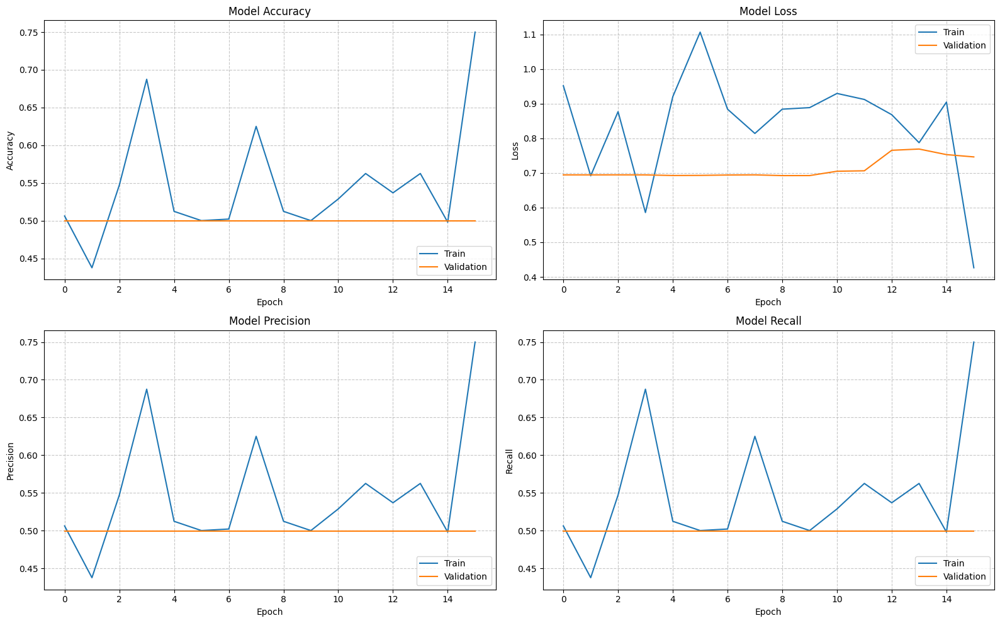


=== Step 4: Finding Optimal Threshold ===
70/70 ━━━━━━━━━━━━━━━━━━━━ 157s 2s/step

Testing different classification thresholds:


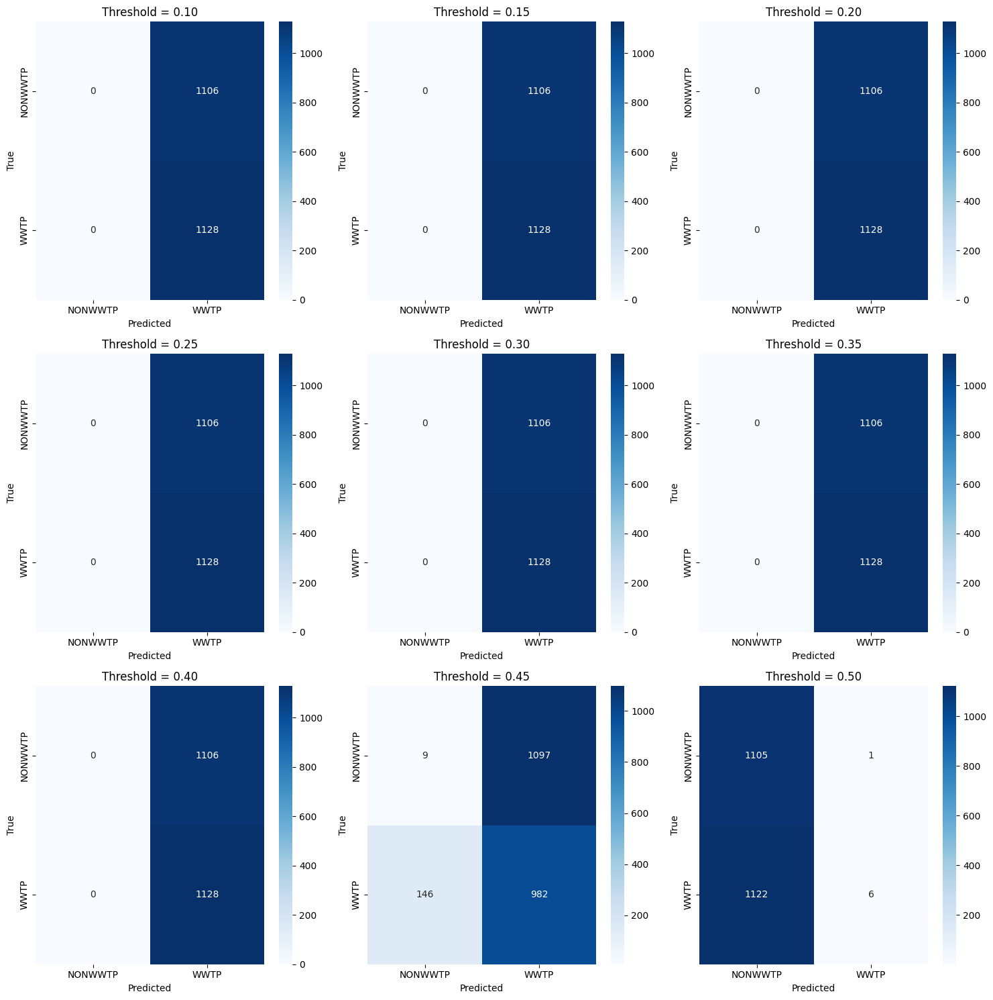


Threshold Analysis Results:
   threshold  accuracy  precision    recall        f1  nonwwtp_accuracy  \
0       0.10  0.504924   0.504924  1.000000  0.671029          0.000000   
1       0.15  0.504924   0.504924  1.000000  0.671029          0.000000   
2       0.20  0.504924   0.504924  1.000000  0.671029          0.000000   
3       0.25  0.504924   0.504924  1.000000  0.671029          0.000000   
4       0.30  0.504924   0.504924  1.000000  0.671029          0.000000   
5       0.35  0.504924   0.504924  1.000000  0.671029          0.000000   
6       0.40  0.504924   0.504924  1.000000  0.671029          0.000000   
7       0.45  0.443599   0.472342  0.870567  0.612410          0.008137   
8       0.50  0.497314   0.857143  0.005319  0.010573          0.999096   

   wwtp_accuracy  
0       1.000000  
1       1.000000  
2       1.000000  
3       1.000000  
4       1.000000  
5       1.000000  
6       1.000000  
7       0.870567  
8       0.005319  


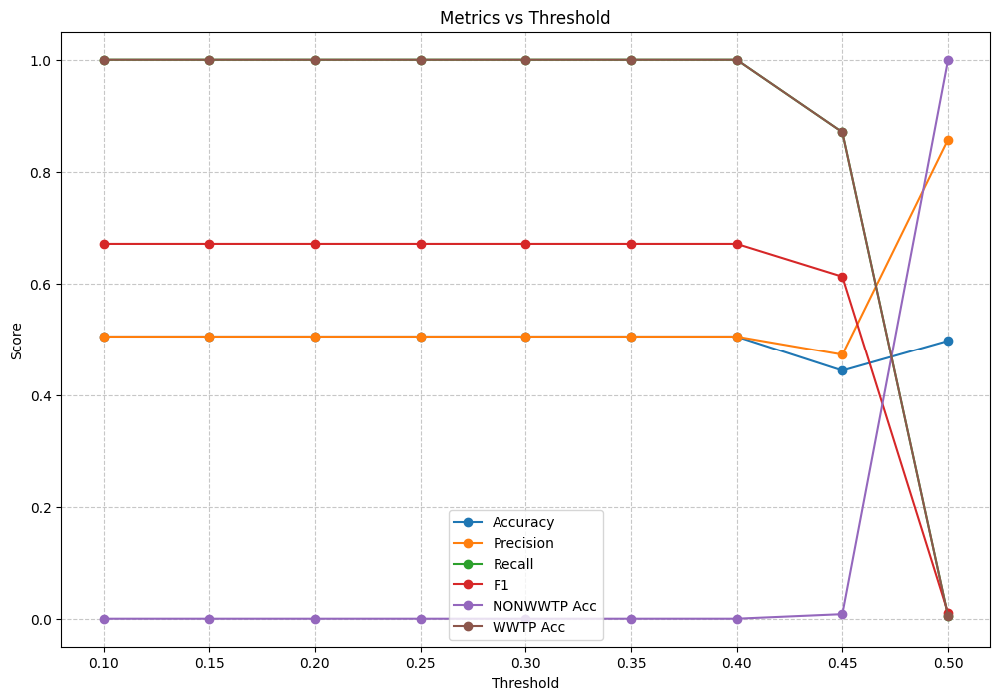


Best threshold based on F1 score:
threshold           0.100000
accuracy            0.504924
precision           0.504924
recall              1.000000
f1                  0.671029
nonwwtp_accuracy    0.000000
wwtp_accuracy       1.000000
Name: 0, dtype: float64

Best threshold for balanced class accuracies:
threshold           0.450000
accuracy            0.443599
precision           0.472342
recall              0.870567
f1                  0.612410
nonwwtp_accuracy    0.008137
wwtp_accuracy       0.870567
min_class_acc       0.008137
Name: 7, dtype: float64

Final Classification Report (Optimized Threshold):
              precision    recall  f1-score   support

     NONWWTP       0.06      0.01      0.01      1106
        WWTP       0.47      0.87      0.61      1128

    accuracy                           0.44      2234
   macro avg       0.27      0.44      0.31      2234
weighted avg       0.27      0.44      0.32      2234



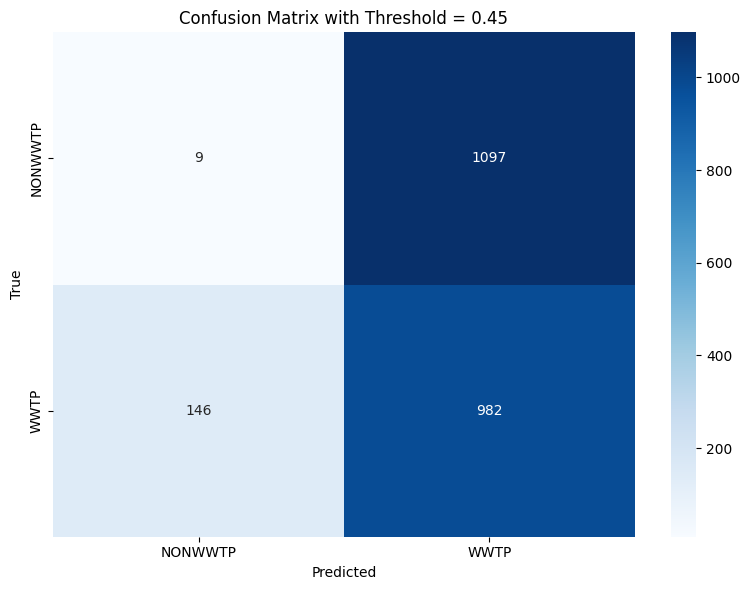


=== Step 5: Visualizing Model Predictions ===
70/70 ━━━━━━━━━━━━━━━━━━━━ 149s 2s/step


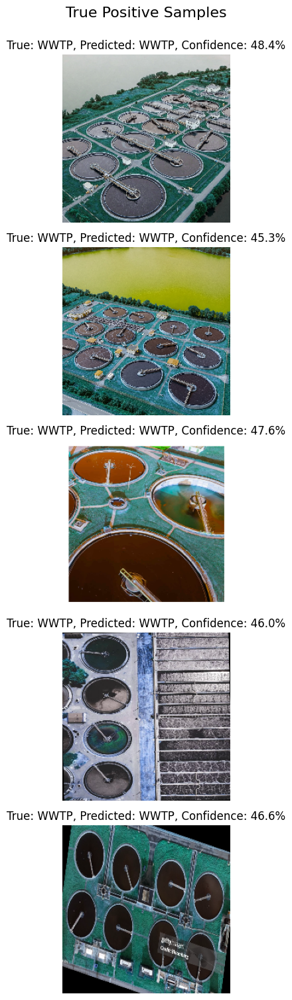

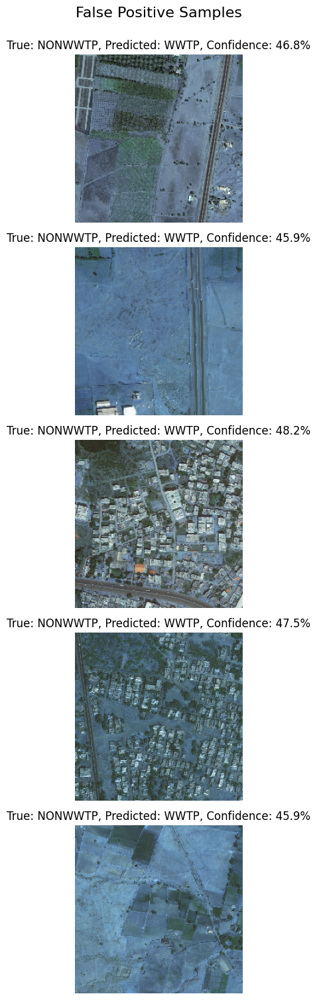

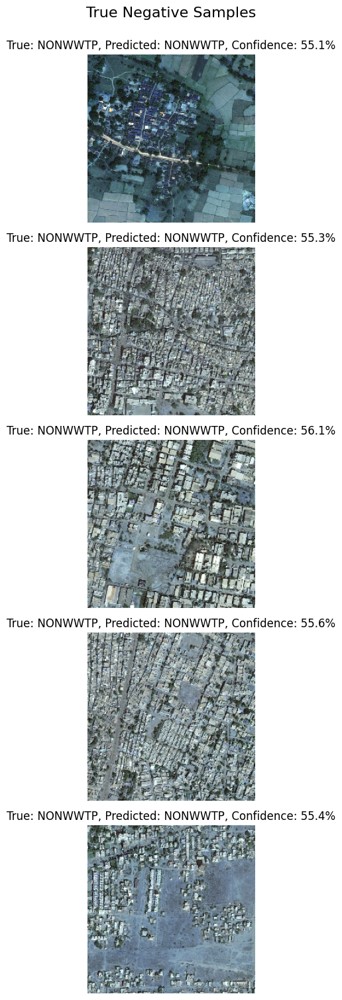

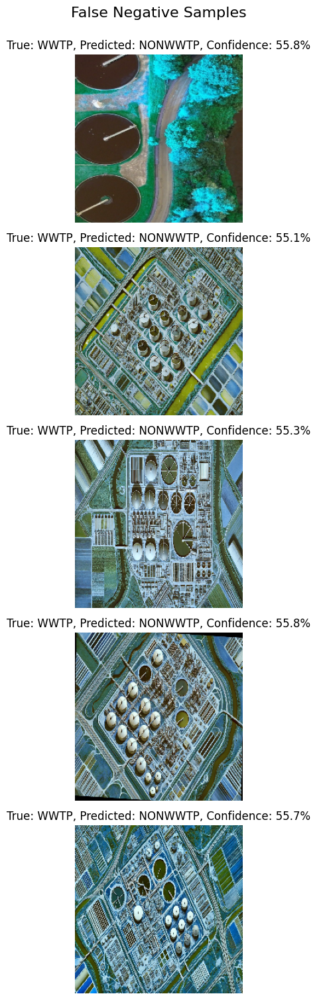


=== Step 6: Visualizing Model Attention ===
70/70 ━━━━━━━━━━━━━━━━━━━━ 152s 2s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


Error visualizing model attention: 'tensorflow.python.framework.ops.EagerTensor' object does not support item assignment

WWTP Detection Pipeline Complete!
Model saved to: /content/drive/MyDrive/HKP/data/output/models/wwtp_detection_model.h5
Best threshold: 0.45000000000000007
Threshold configuration saved to: /content/drive/MyDrive/HKP/data/output/models/threshold_config.txt


<Figure size 1500x1500 with 0 Axes>

In [ ]:
import tensorflow as tf
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.utils import class_weight, shuffle
import seaborn as sns
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define paths
BASE_PATH = "/content/drive/MyDrive/HKP/data"
OUTPUT_PATH = os.path.join(BASE_PATH, "output")
MODEL_PATH = os.path.join(OUTPUT_PATH, "models")
BALANCED_PATH = os.path.join(OUTPUT_PATH, "balanced_dataset")

# Create output directories if they don't exist
for path in [OUTPUT_PATH, MODEL_PATH, BALANCED_PATH]:
    if not os.path.exists(path):
        os.makedirs(path)

# Parameters
IMG_SIZE = (224, 224)
BATCH_SIZE = 16
EPOCHS = 25
NUM_CLASSES = 2
LEARNING_RATE = 0.0001

# Define categories
CATEGORIES = {
    "NONWWTP": 0,
    "WWTP": 1
}

#############################################
# Step 1: Data Analysis and Preparation     #
#############################################

def analyze_dataset_distribution():
    """Analyze the class distribution in your dataset"""
    counts = {category: {'train': 0, 'valid': 0, 'test': 0} for category in CATEGORIES}

    # Count images in each category and split
    for category in CATEGORIES:
        for split in ['train', 'valid', 'test']:
            folder_path = os.path.join(BASE_PATH, category, split)
            if os.path.exists(folder_path):
                files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.avif', '.webp'))]
                counts[category][split] = len(files)

    # Print the distribution
    print("Dataset Distribution:")
    for category, splits in counts.items():
        print(f"\n{category}:")
        for split, count in splits.items():
            print(f"  {split}: {count} images")

    # Calculate totals
    train_total = sum(counts[cat]['train'] for cat in CATEGORIES)
    valid_total = sum(counts[cat]['valid'] for cat in CATEGORIES)
    test_total = sum(counts[cat]['test'] for cat in CATEGORIES)

    # Calculate class ratios
    if train_total > 0:
        train_ratio = counts["WWTP"]['train'] / train_total
        print(f"\nTraining set WWTP ratio: {train_ratio:.2f} ({counts['WWTP']['train']}/{train_total})")

    # Visualize the distribution
    plt.figure(figsize=(10, 6))

    x = np.arange(3)  # 3 splits
    width = 0.35

    nonwwtp_counts = [counts["NONWWTP"]['train'], counts["NONWWTP"]['valid'], counts["NONWWTP"]['test']]
    wwtp_counts = [counts["WWTP"]['train'], counts["WWTP"]['valid'], counts["WWTP"]['test']]

    plt.bar(x - width/2, nonwwtp_counts, width, label='NONWWTP')
    plt.bar(x + width/2, wwtp_counts, width, label='WWTP')

    plt.xlabel('Dataset Split')
    plt.ylabel('Number of Images')
    plt.title('Class Distribution Across Dataset Splits')
    plt.xticks(x, ['Train', 'Validation', 'Test'])
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    for i, v in enumerate(nonwwtp_counts):
        plt.text(i - width/2, v + 5, str(v), ha='center')

    for i, v in enumerate(wwtp_counts):
        plt.text(i + width/2, v + 5, str(v), ha='center')

    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_PATH, 'class_distribution.png'))
    plt.show()

    return counts

def create_balanced_dataset_with_augmentation():
    """Create a balanced dataset with augmentation of the minority class"""
    # Create directories for balanced dataset
    for split in ['train', 'valid', 'test']:
        for category in CATEGORIES.keys():
            balanced_dir = os.path.join(BALANCED_PATH, category, split)
            if not os.path.exists(balanced_dir):
                os.makedirs(balanced_dir)

    # Analyze dataset distribution
    counts = analyze_dataset_distribution()

    # Calculate augmentation factor needed for each split
    augmentation_factor = {
        'train': int(np.ceil(counts['NONWWTP']['train'] / counts['WWTP']['train'])) if counts['WWTP']['train'] > 0 else 0,
        'valid': int(np.ceil(counts['NONWWTP']['valid'] / counts['WWTP']['valid'])) if counts['WWTP']['valid'] > 0 else 0,
        'test': int(np.ceil(counts['NONWWTP']['test'] / counts['WWTP']['test'])) if counts['WWTP']['test'] > 0 else 0
    }

    print(f"\nAugmentation factors needed for WWTP images:")
    for split, factor in augmentation_factor.items():
        print(f"  {split}: {factor}x")

    # Process each split and category
    for split in ['train', 'valid', 'test']:
        for category in CATEGORIES.keys():
            source_dir = os.path.join(BASE_PATH, category, split)
            dest_dir = os.path.join(BALANCED_PATH, category, split)

            if not os.path.exists(source_dir):
                print(f"Warning: {source_dir} does not exist. Skipping...")
                continue

            files = [f for f in os.listdir(source_dir)
                    if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.webp', '.avif'))]

            print(f"Processing {len(files)} {category} images for {split}")

            # If this is the majority class (NONWWTP), just copy the files
            if category == 'NONWWTP':
                for filename in files:
                    src_path = os.path.join(source_dir, filename)
                    dst_path = os.path.join(dest_dir, filename)

                    img = cv2.imread(src_path)
                    if img is not None:
                        cv2.imwrite(dst_path, img)

            # If this is the minority class (WWTP), copy and augment
            else:
                # First, copy all original files
                for filename in files:
                    src_path = os.path.join(source_dir, filename)
                    dst_path = os.path.join(dest_dir, filename)

                    img = cv2.imread(src_path)
                    if img is not None:
                        cv2.imwrite(dst_path, img)

                # Then create augmented versions
                factor = augmentation_factor[split]
                if factor <= 1:
                    continue  # Skip if no augmentation needed

                for i, filename in enumerate(files):
                    src_path = os.path.join(source_dir, filename)
                    img = cv2.imread(src_path)

                    if img is None:
                        continue

                    base_name, ext = os.path.splitext(filename)

                    # Create augmented versions
                    for j in range(1, factor):
                        # Apply different augmentations based on index
                        augmented = img.copy()

                        # Rotation
                        if j % 4 == 0:
                            angle = np.random.randint(-30, 30)
                            M = cv2.getRotationMatrix2D((img.shape[1]//2, img.shape[0]//2), angle, 1.0)
                            augmented = cv2.warpAffine(augmented, M, (img.shape[1], img.shape[0]))

                        # Flip
                        elif j % 4 == 1:
                            if np.random.rand() > 0.5:
                                augmented = cv2.flip(augmented, 1)  # horizontal flip
                            else:
                                augmented = cv2.flip(augmented, 0)  # vertical flip

                        # Brightness/Contrast adjustment
                        elif j % 4 == 2:
                            # Convert to HSV for better color manipulation
                            hsv = cv2.cvtColor(augmented, cv2.COLOR_BGR2HSV)
                            # Adjust brightness (Value in HSV)
                            brightness_factor = np.random.uniform(0.8, 1.2)
                            hsv[:,:,2] = np.clip(hsv[:,:,2] * brightness_factor, 0, 255)
                            augmented = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

                        # Zoom and Crop
                        else:
                            # Apply zoom by resizing and then cropping back
                            zoom_factor = np.random.uniform(1.1, 1.3)
                            h, w = augmented.shape[:2]
                            zoomed = cv2.resize(augmented, None, fx=zoom_factor, fy=zoom_factor)
                            # Calculate crop coordinates
                            zh, zw = zoomed.shape[:2]
                            start_x = (zw - w) // 2
                            start_y = (zh - h) // 2
                            # Crop to original size
                            augmented = zoomed[start_y:start_y+h, start_x:start_x+w]

                        # Save the augmented image
                        aug_filename = f"{base_name}_aug{j}{ext}"
                        aug_dst_path = os.path.join(dest_dir, aug_filename)
                        cv2.imwrite(aug_dst_path, augmented)

                    if (i+1) % 10 == 0:
                        print(f"  Processed {i+1}/{len(files)} images with {factor-1} augmentations each")

    print("\nBalanced dataset created successfully!")
    return BALANCED_PATH

def load_balanced_data():
    """Load data from the balanced dataset"""
    X_train, y_train = [], []
    X_val, y_val = [], []
    X_test, y_test = [], []

    # First try to load from the balanced dataset
    balanced_dataset_exists = all(
        os.path.exists(os.path.join(BALANCED_PATH, category, split))
        for category in CATEGORIES
        for split in ['train', 'valid', 'test']
    )

    if not balanced_dataset_exists:
        print("Balanced dataset not found. Creating one...")
        create_balanced_dataset_with_augmentation()

    # Load data from balanced dataset
    print("Loading data from balanced dataset...")
    for category, label in CATEGORIES.items():
        for split in ['train', 'valid', 'test']:
            folder_path = os.path.join(BALANCED_PATH, category, split)
            if not os.path.exists(folder_path):
                print(f"Warning: {folder_path} does not exist. Skipping...")
                continue

            files = [f for f in os.listdir(folder_path)
                    if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.webp', '.avif'))]

            print(f"Loading {len(files)} {category} images from {split}")

            for filename in files:
                img_path = os.path.join(folder_path, filename)
                img = cv2.imread(img_path)
                if img is not None:
                    img = cv2.resize(img, IMG_SIZE)

                    if split == 'train':
                        X_train.append(img)
                        y_train.append(label)
                    elif split == 'valid':
                        X_val.append(img)
                        y_val.append(label)
                    else:  # test
                        X_test.append(img)
                        y_test.append(label)

    # Convert to numpy arrays
    X_train = np.array(X_train).astype('float32') / 255.0
    y_train = np.array(y_train)
    X_val = np.array(X_val).astype('float32') / 255.0
    y_val = np.array(y_val)
    X_test = np.array(X_test).astype('float32') / 255.0
    y_test = np.array(y_test)

    # Shuffle data
    X_train, y_train = shuffle(X_train, y_train, random_state=42)
    X_val, y_val = shuffle(X_val, y_val, random_state=42)
    X_test, y_test = shuffle(X_test, y_test, random_state=42)

    # Convert labels to categorical
    y_train_cat = to_categorical(y_train, num_classes=NUM_CLASSES)
    y_val_cat = to_categorical(y_val, num_classes=NUM_CLASSES)
    y_test_cat = to_categorical(y_test, num_classes=NUM_CLASSES)

    # Compute class weights to further address imbalance
    class_weights = class_weight.compute_class_weight(
        class_weight='balanced',
        classes=np.unique(y_train),
        y=y_train
    )
    class_weight_dict = {i: weight for i, weight in enumerate(class_weights)}

    print(f"\nLoaded dataset statistics:")
    print(f"Training set: {X_train.shape[0]} samples")
    print(f"  NONWWTP: {np.sum(y_train == 0)}")
    print(f"  WWTP: {np.sum(y_train == 1)}")
    print(f"Validation set: {X_val.shape[0]} samples")
    print(f"  NONWWTP: {np.sum(y_val == 0)}")
    print(f"  WWTP: {np.sum(y_val == 1)}")
    print(f"Test set: {X_test.shape[0]} samples")
    print(f"  NONWWTP: {np.sum(y_test == 0)}")
    print(f"  WWTP: {np.sum(y_test == 1)}")
    print(f"Class weights: {class_weight_dict}")

    return X_train, y_train_cat, X_val, y_val_cat, X_test, y_test_cat, class_weight_dict

#############################################
# Step 2: Model Building and Training       #
#############################################

def build_improved_model(input_shape=(224, 224, 3), num_classes=2):
    """Build an improved model architecture for WWTP detection"""
    # Use a pre-trained model with more capacity
    base_model = EfficientNetB0(
        weights='imagenet',
        include_top=False,
        input_shape=input_shape
    )

    # Add custom layers
    x = base_model.output
    x = GlobalAveragePooling2D()(x)

    # Add deeper layers with strong regularization
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.5)(x)  # High dropout for better regularization

    x = Dense(256, activation='relu')(x)
    x = Dropout(0.4)(x)

    # Add batch normalization for more stable training
    x = tf.keras.layers.BatchNormalization()(x)

    x = Dense(128, activation='relu')(x)
    x = Dropout(0.3)(x)

    # Final classification layer
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    # Freeze early layers to prevent overfitting
    for layer in base_model.layers[:100]:
        layer.trainable = False

    # Compile with appropriate loss and metrics
    model.compile(
        optimizer=Adam(learning_rate=LEARNING_RATE),
        loss='categorical_crossentropy',
        metrics=[
            'accuracy',
            tf.keras.metrics.Precision(name='precision'),
            tf.keras.metrics.Recall(name='recall'),
            tf.keras.metrics.AUC(name='auc')
        ]
    )

    return model

def get_training_callbacks():
    """Set up callbacks for training"""

    # Create checkpoint directory if it doesn't exist
    checkpoint_dir = os.path.join(MODEL_PATH, 'checkpoints')
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)

    # Model checkpoint to save the best model
    checkpoint = ModelCheckpoint(
        os.path.join(checkpoint_dir, 'model_epoch_{epoch:02d}_val_recall_{val_recall:.2f}.h5'),
        monitor='val_recall',  # Focus on recall to catch all WWTPs
        save_best_only=True,
        mode='max',
        verbose=1,
        save_weights_only=False
    )

    # Early stopping to prevent overfitting
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=7,
        restore_best_weights=True,
        mode='min',
        verbose=1
    )

    # Reduce learning rate when training plateaus
    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=3,
        min_lr=1e-6,
        verbose=1
    )

    # TensorBoard logging for better visualization
    tensorboard = tf.keras.callbacks.TensorBoard(
        log_dir=os.path.join(OUTPUT_PATH, 'logs'),
        histogram_freq=1,
        write_graph=True,
        update_freq='epoch'
    )

    return [checkpoint, early_stopping, reduce_lr, tensorboard]

def train_model_with_data_augmentation(X_train, y_train_cat, X_val, y_val_cat, class_weight_dict):
    """Train the model with real-time data augmentation"""

    # Set up data augmentation for training
    train_datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest',
        brightness_range=[0.8, 1.2]
    )

    # No augmentation for validation
    val_datagen = ImageDataGenerator()

    # Create the model
    model = build_improved_model(input_shape=IMG_SIZE + (3,), num_classes=NUM_CLASSES)
    print("Model architecture:")
    model.summary()

    # Get callbacks
    callbacks = get_training_callbacks()

    # Train the model
    print("\nStarting model training with data augmentation...")

    # Set up generators
    train_generator = train_datagen.flow(
        X_train, y_train_cat,
        batch_size=BATCH_SIZE,
        shuffle=True
    )

    val_generator = val_datagen.flow(
        X_val, y_val_cat,
        batch_size=BATCH_SIZE,
        shuffle=False
    )

    # Train the model
    history = model.fit(
        train_generator,
        steps_per_epoch=len(X_train) // BATCH_SIZE,
        epochs=EPOCHS,
        validation_data=val_generator,
        validation_steps=len(X_val) // BATCH_SIZE,
        callbacks=callbacks,
        class_weight=class_weight_dict,
        verbose=1
    )

    # Save the final model
    model.save(os.path.join(MODEL_PATH, 'wwtp_detection_model.h5'))

    # Plot training history
    plot_training_history(history)

    return model, history

def plot_training_history(history):
    """Plot the training history metrics"""
    plt.figure(figsize=(16, 10))

    # Plot accuracy
    plt.subplot(2, 2, 1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='lower right')
    plt.grid(True, linestyle='--', alpha=0.7)

    # Plot loss
    plt.subplot(2, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper right')
    plt.grid(True, linestyle='--', alpha=0.7)

    # Plot precision
    plt.subplot(2, 2, 3)
    plt.plot(history.history['precision'])
    plt.plot(history.history['val_precision'])
    plt.title('Model Precision')
    plt.ylabel('Precision')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='lower right')
    plt.grid(True, linestyle='--', alpha=0.7)

    # Plot recall (most important for finding all WWTPs)
    plt.subplot(2, 2, 4)
    plt.plot(history.history['recall'])
    plt.plot(history.history['val_recall'])
    plt.title('Model Recall')
    plt.ylabel('Recall')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='lower right')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_PATH, 'training_history.png'))
    plt.show()

#############################################
# Step 3: Model Evaluation and Optimization #
#############################################

def find_optimal_threshold(model, X_test, y_test_cat):
    """Find the optimal threshold for classification"""

    # Get model predictions (probabilities)
    y_pred_prob = model.predict(X_test)

    # Get true labels
    y_true = np.argmax(y_test_cat, axis=1)

    # Try different thresholds for the WWTP class (class 1)
    thresholds = np.arange(0.1, 0.9, 0.05)
    results = []

    print("\nTesting different classification thresholds:")

    # Set up a grid for plotting confusion matrices
    fig, axs = plt.subplots(3, 3, figsize=(15, 15))
    axs = axs.flatten()

    for i, threshold in enumerate(thresholds):
        if i < 9:  # Only plot 9 thresholds to avoid overcrowding
            # Apply threshold to the WWTP class probability
            adjusted_preds = (y_pred_prob[:, 1] > threshold).astype(int)

            # Calculate metrics
            accuracy = accuracy_score(y_true, adjusted_preds)
            precision = precision_score(y_true, adjusted_preds, average='binary', zero_division=0)
            recall = recall_score(y_true, adjusted_preds, average='binary', zero_division=0)
            f1 = f1_score(y_true, adjusted_preds, average='binary', zero_division=0)

            # Compute confusion matrix
            cm = confusion_matrix(y_true, adjusted_preds)

            # Calculate class-specific accuracies
            if sum(y_true == 0) > 0:
                nonwwtp_accuracy = cm[0, 0] / sum(y_true == 0)
            else:
                nonwwtp_accuracy = 0

            if sum(y_true == 1) > 0:
                wwtp_accuracy = cm[1, 1] / sum(y_true == 1)
            else:
                wwtp_accuracy = 0

            # Store results
            results.append({
                'threshold': threshold,
                'accuracy': accuracy,
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'nonwwtp_accuracy': nonwwtp_accuracy,
                'wwtp_accuracy': wwtp_accuracy,
                'conf_matrix': cm
            })

            # Plot confusion matrix
            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                      ax=axs[i], xticklabels=['NONWWTP', 'WWTP'], yticklabels=['NONWWTP', 'WWTP'])
            axs[i].set_title(f'Threshold = {threshold:.2f}')
            axs[i].set_xlabel('Predicted')
            axs[i].set_ylabel('True')

    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_PATH, 'threshold_analysis.png'))
    plt.show()

    # Create a dataframe for better visualization of threshold results
    import pandas as pd
    results_df = pd.DataFrame(results)
    results_df = results_df.drop('conf_matrix', axis=1)
    print("\nThreshold Analysis Results:")
    print(results_df)

    # Plot the metrics vs threshold
    plt.figure(figsize=(12, 8))
    plt.plot(results_df['threshold'], results_df['accuracy'], 'o-', label='Accuracy')
    plt.plot(results_df['threshold'], results_df['precision'], 'o-', label='Precision')
    plt.plot(results_df['threshold'], results_df['recall'], 'o-', label='Recall')
    plt.plot(results_df['threshold'], results_df['f1'], 'o-', label='F1')
    plt.plot(results_df['threshold'], results_df['nonwwtp_accuracy'], 'o-', label='NONWWTP Acc')
    plt.plot(results_df['threshold'], results_df['wwtp_accuracy'], 'o-', label='WWTP Acc')

    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.title('Metrics vs Threshold')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.savefig(os.path.join(OUTPUT_PATH, 'metrics_vs_threshold.png'))
    plt.show()

    # Find the best threshold based on F1 score
    best_f1_threshold = results_df.iloc[results_df['f1'].idxmax()]

    # Find the best threshold for balanced class accuracies
    results_df['min_class_acc'] = results_df[['nonwwtp_accuracy', 'wwtp_accuracy']].min(axis=1)
    best_balanced_threshold = results_df.iloc[results_df['min_class_acc'].idxmax()]

    print("\nBest threshold based on F1 score:")
    print(best_f1_threshold)

    print("\nBest threshold for balanced class accuracies:")
    print(best_balanced_threshold)

    # Choose the best threshold
    best_threshold = best_balanced_threshold['threshold']

    # Apply the final threshold
    final_preds = (y_pred_prob[:, 1] > best_threshold).astype(int)

    # Generate final evaluation report
    print("\nFinal Classification Report (Optimized Threshold):")
    print(classification_report(y_true, final_preds, target_names=list(CATEGORIES.keys())))

    # Plot final confusion matrix
    plt.figure(figsize=(8, 6))
    cm = confusion_matrix(y_true, final_preds)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
               xticklabels=list(CATEGORIES.keys()),
               yticklabels=list(CATEGORIES.keys()))
    plt.title(f'Confusion Matrix with Threshold = {best_threshold:.2f}')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_PATH, 'final_confusion_matrix.png'))
    plt.show()

    return best_threshold, final_preds

def visualize_predictions(model, X_test, y_test_cat, threshold, num_samples=5):
    """Visualize model predictions on test samples"""
    # Get model predictions
    y_pred_prob = model.predict(X_test)
    y_pred = (y_pred_prob[:, 1] > threshold).astype(int)
    y_true = np.argmax(y_test_cat, axis=1)

    # Create categories of predictions for visualization
    categories = {
        'true_positive': np.where((y_pred == 1) & (y_true == 1))[0],
        'false_positive': np.where((y_pred == 1) & (y_true == 0))[0],
        'true_negative': np.where((y_pred == 0) & (y_true == 0))[0],
        'false_negative': np.where((y_pred == 0) & (y_true == 1))[0]
    }

    # Visualize samples from each category
    for category, indices in categories.items():
        if len(indices) == 0:
            print(f"No {category} samples found.")
            continue

        # Select samples (up to num_samples)
        selected_indices = indices[:min(num_samples, len(indices))]

        plt.figure(figsize=(15, 3 * len(selected_indices)))
        plt.suptitle(f"{category.replace('_', ' ').title()} Samples", fontsize=16, y=1.0)

        for i, idx in enumerate(selected_indices):
            # Get the image
            img = X_test[idx]

            # Get prediction info
            true_label = list(CATEGORIES.keys())[y_true[idx]]
            pred_label = list(CATEGORIES.keys())[y_pred[idx]]
            confidence = y_pred_prob[idx, y_pred[idx]] * 100

            # Display the image
            plt.subplot(len(selected_indices), 1, i+1)
            plt.imshow(img)
            plt.title(f"True: {true_label}, Predicted: {pred_label}, Confidence: {confidence:.1f}%")
            plt.axis('off')

        plt.tight_layout()
        plt.savefig(os.path.join(OUTPUT_PATH, f'{category}_samples.png'))
        plt.show()

def visualize_model_attention(model, X_test, y_test_cat, threshold, num_samples=3):
    """Visualize what the model is paying attention to using Grad-CAM"""
    try:
        # Get model predictions
        y_pred_prob = model.predict(X_test)
        y_pred = (y_pred_prob[:, 1] > threshold).astype(int)
        y_true = np.argmax(y_test_cat, axis=1)

        # Get WWTP samples (both true and predicted)
        wwtp_indices = np.union1d(
            np.where(y_true == 1)[0],  # True WWTP
            np.where(y_pred == 1)[0]   # Predicted WWTP
        )

        if len(wwtp_indices) == 0:
            print("No WWTP samples found for attention visualization.")
            return

        # Select a few samples
        selected_indices = wwtp_indices[:min(num_samples, len(wwtp_indices))]

        # Find the last convolutional layer in the model
        last_conv_layer = None
        for layer in reversed(model.layers):
            if isinstance(layer, tf.keras.layers.Conv2D):
                last_conv_layer = layer.name
                break

        if last_conv_layer is None:
            print("No convolutional layer found in the model.")
            return

        # Create Grad-CAM visualization for each selected sample
        plt.figure(figsize=(15, 5 * len(selected_indices)))

        for i, idx in enumerate(selected_indices):
            # Get the sample
            img = X_test[idx]
            img_array = np.expand_dims(img, axis=0)

            # Create a model that returns the last conv layer output and predictions
            grad_model = tf.keras.models.Model(
                inputs=model.inputs,
                outputs=[model.get_layer(last_conv_layer).output, model.output]
            )

            # Get gradients
            with tf.GradientTape() as tape:
                conv_outputs, predictions = grad_model(img_array)
                class_idx = int(y_pred[idx])  # Use the predicted class
                class_output = predictions[:, class_idx]

            # Compute gradients
            grads = tape.gradient(class_output, conv_outputs)

            # Pool gradients
            pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

            # Weight the channels by the gradient importance
            conv_outputs = conv_outputs[0]
            for j in range(pooled_grads.shape[0]):
                conv_outputs[:, :, j] *= pooled_grads[j]

            # Create a heatmap
            heatmap = tf.reduce_mean(conv_outputs, axis=-1)
            heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
            heatmap = heatmap.numpy()

            # Resize heatmap to match input image size
            heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

            # Convert to RGB for visualization
            heatmap = np.uint8(255 * heatmap)
            heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

            # Prepare original image
            orig_img = np.uint8(255 * img)

            # Superimpose heatmap
            superimposed_img = cv2.addWeighted(orig_img, 0.7, heatmap, 0.3, 0)

            # Get labels
            true_label = list(CATEGORIES.keys())[y_true[idx]]
            pred_label = list(CATEGORIES.keys())[y_pred[idx]]
            confidence = y_pred_prob[idx, class_idx] * 100

            # Display original image
            plt.subplot(len(selected_indices), 3, i*3 + 1)
            plt.imshow(img)
            plt.title(f"True: {true_label}, Pred: {pred_label}\nConf: {confidence:.1f}%")
            plt.axis('off')

            # Display heatmap
            plt.subplot(len(selected_indices), 3, i*3 + 2)
            plt.imshow(heatmap)
            plt.title("Attention Heatmap")
            plt.axis('off')

            # Display superimposed image
            plt.subplot(len(selected_indices), 3, i*3 + 3)
            plt.imshow(superimposed_img)
            plt.title("Model Attention")
            plt.axis('off')

        plt.tight_layout()
        plt.savefig(os.path.join(OUTPUT_PATH, 'model_attention.png'))
        plt.show()

    except Exception as e:
        print(f"Error visualizing model attention: {e}")

#############################################
# Step 4: Integrated Pipeline              #
#############################################

def run_wwtp_detection_pipeline():
    """Run the complete WWTP detection pipeline"""

    # 1. Create output directories
    for path in [OUTPUT_PATH, MODEL_PATH, BALANCED_PATH]:
        os.makedirs(path, exist_ok=True)

    # 2. Analyze dataset
    print("\n=== Step 1: Analyzing Dataset Distribution ===")
    analyze_dataset_distribution()

    # 3. Load balanced data with augmentation
    print("\n=== Step 2: Loading Balanced Data ===")
    X_train, y_train_cat, X_val, y_val_cat, X_test, y_test_cat, class_weight_dict = load_balanced_data()

    # 4. Train the model
    print("\n=== Step 3: Training Model ===")
    model, history = train_model_with_data_augmentation(
        X_train, y_train_cat, X_val, y_val_cat, class_weight_dict
    )

    # 5. Find optimal threshold
    print("\n=== Step 4: Finding Optimal Threshold ===")
    best_threshold, final_preds = find_optimal_threshold(model, X_test, y_test_cat)

    # 6. Visualize model predictions
    print("\n=== Step 5: Visualizing Model Predictions ===")
    visualize_predictions(model, X_test, y_test_cat, best_threshold)

    # 7. Visualize model attention
    print("\n=== Step 6: Visualizing Model Attention ===")
    visualize_model_attention(model, X_test, y_test_cat, best_threshold)

    # 8. Save threshold configuration
    threshold_config_path = os.path.join(MODEL_PATH, 'threshold_config.txt')
    with open(threshold_config_path, 'w') as f:
        f.write(f"Best detection threshold: {best_threshold}\n")
        f.write(f"Model path: {os.path.join(MODEL_PATH, 'wwtp_detection_model.h5')}\n")

    print(f"\nWWTP Detection Pipeline Complete!")
    print(f"Model saved to: {os.path.join(MODEL_PATH, 'wwtp_detection_model.h5')}")
    print(f"Best threshold: {best_threshold}")
    print(f"Threshold configuration saved to: {threshold_config_path}")

    return model, best_threshold

#############################################
# Main Execution                            #
#############################################

if __name__ == "__main__":
    # Mount Google Drive
    drive.mount('/content/drive')

    # Run the pipeline
    model, best_threshold = run_wwtp_detection_pipeline()

In [ ]:
# 8. Save threshold configuration
threshold_config_path = 'threshold_config.txt'
with open(threshold_config_path, 'w') as f:
    f.write(f"Best detection threshold: {best_threshold}\n")
    f.write('wwtp_detection_model.h5')